In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
import matplotlib.pyplot as plt
import numpy as np

def format_plt():
    """
    Formats matplotlib to appear use Latex + Seaborn theme.
    """
    global plt
    plt.rcParams.update(
        {
            "text.usetex": True,
            "font.family": "serif",
            "font.serif": ["Computer Modern Roman"],  # or another LaTeX font
            "axes.grid": False,
            "text.color": "black",
        }
    )
    plt.rcParams["figure.figsize"] = [5, 5]
    plt.style.use("seaborn-v0_8-bright")

format_plt()

# Gaussian Process example

In [5]:
from stonesoup.types.groundtruth import GroundTruthPath, GroundTruthState
from mystonesoup.drivers import GaussianDriver
from mystonesoup.base import CombinedLinearNonGaussianTransitionExtModel
from mystonesoup.models import Process
from datetime import datetime, timedelta

# And the clock starts
start_time = datetime.now().replace(microsecond=0)
seed = 1991

mu_W = 0.
sigma_W = 1.

gaussian_driver_x = GaussianDriver(mu_W=mu_W, sigma_W=sigma_W, seed=seed)
process_x = Process(g_driver=gaussian_driver_x)
gaussian_driver_x.register_model(process_x)

gaussian_driver_y = GaussianDriver(mu_W=mu_W, sigma_W=sigma_W, seed=seed+1)
process_y = Process(g_driver=gaussian_driver_y)
gaussian_driver_y.register_model(process_y)
transition_model = CombinedLinearNonGaussianTransitionExtModel([process_x, process_y])

timesteps = [start_time]
truth = GroundTruthPath([GroundTruthState([0, 0], timestamp=timesteps[0])])

num_steps = 100
for k in range(1, num_steps + 1):
    
    timesteps.append(start_time+timedelta(seconds=k))  # add next timestep to list of timesteps
    truth.append(GroundTruthState(
        transition_model.function(truth[k-1], noise=True, time_interval=timedelta(seconds=1)),
        timestamp=timesteps[k]))

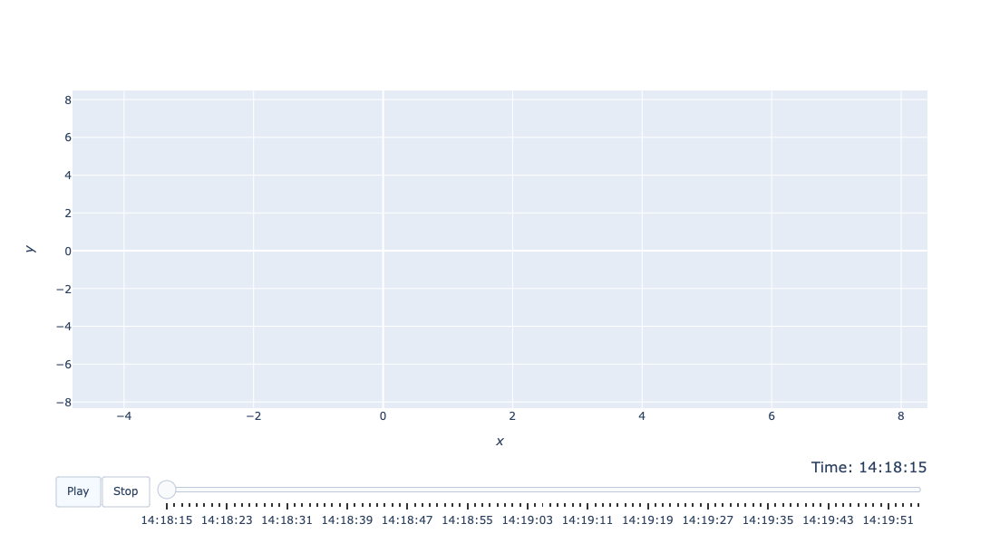

In [6]:
from stonesoup.plotter import AnimatedPlotterly
plotter = AnimatedPlotterly(timesteps, tail_length=0.3, width=600, height=600,)
plotter.plot_ground_truths(truth, [0, 1])
plotter.fig

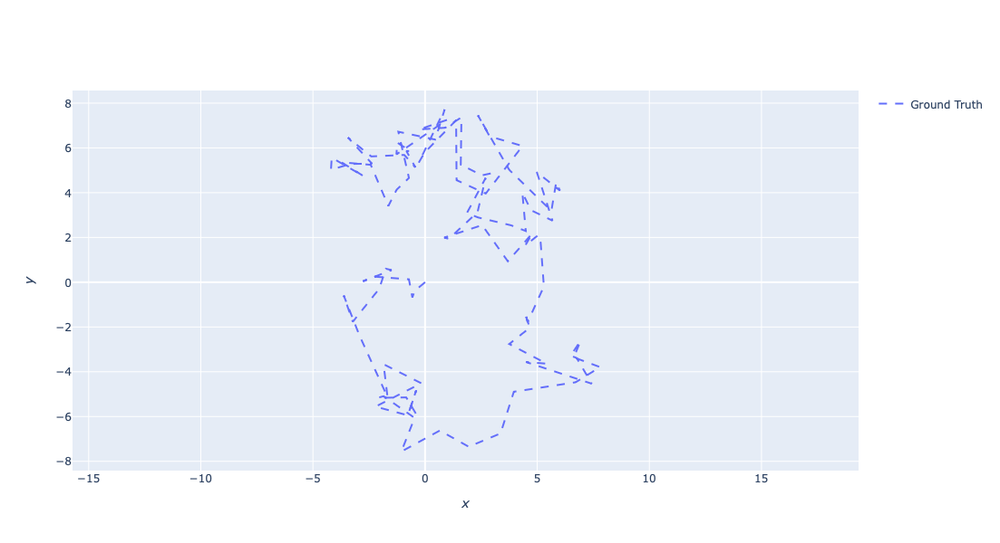

In [7]:
from stonesoup.plotter import Plotterly

plotter_static = Plotterly(autosize=False,
    width=600,
    height=600,)
plotter_static.plot_ground_truths(truth, [0, 1])
plotter_static.fig

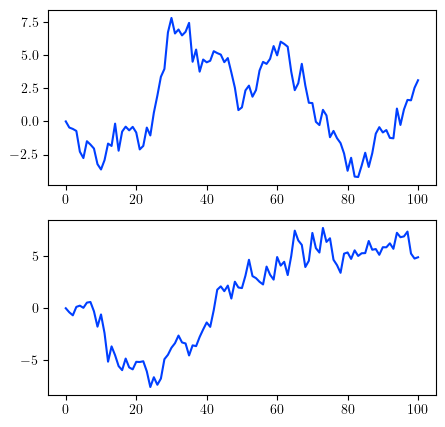

In [8]:
t = np.array([(data.timestamp - start_time).total_seconds() for data in truth])
t -= t[0]
y0 = np.array([data.state_vector[0] for data in truth])
y1 = np.array([data.state_vector[1] for data in truth])

fig, [ax1, ax2] = plt.subplots(nrows=2, ncols=1)

ax1.plot(t, y0)
ax2.plot(t, y1)


# Alpha-stable Process Example

In [16]:
from stonesoup.types.groundtruth import GroundTruthPath, GroundTruthState
from mystonesoup.drivers import AlphaStableDriver
from mystonesoup.base import CombinedLinearNonGaussianTransitionExtModel
from mystonesoup.models import Process
from datetime import datetime, timedelta

# And the clock starts
start_time = datetime.now().replace(microsecond=0)
seed = 1991

mu_W = 0.
sigma_W = 1.
c = 10
alpha = 0.8
noise_case = 2

as_driver_x = AlphaStableDriver(c=c, alpha=alpha, mu_W=mu_W, sigma_W=sigma_W, noise_case=noise_case, seed=seed)
process_x = Process(ng_driver=as_driver_x)
as_driver_x.register_model(process_x)

process_y = Process(ng_driver=as_driver_x)
as_driver_x.register_model(process_y)
transition_model = CombinedLinearNonGaussianTransitionExtModel([process_x, process_y])

timesteps = [start_time]
truth = GroundTruthPath([GroundTruthState([0, 0], timestamp=timesteps[0])])

num_steps = 100
for k in range(1, num_steps + 1):
    timesteps.append(start_time+timedelta(seconds=k))  # add next timestep to list of timesteps
    truth.append(GroundTruthState(
        transition_model.function(truth[k-1], noise=True, time_interval=timedelta(seconds=1)),
        timestamp=timesteps[k]))

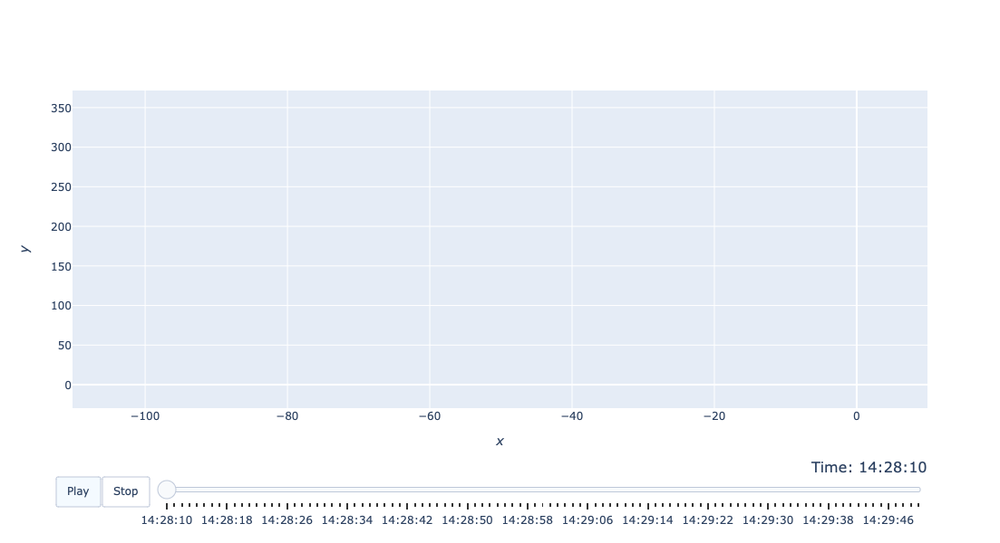

In [17]:
from stonesoup.plotter import AnimatedPlotterly
plotter = AnimatedPlotterly(timesteps, tail_length=0.3, width=600, height=600,)
plotter.plot_ground_truths(truth, [0, 1])
plotter.fig

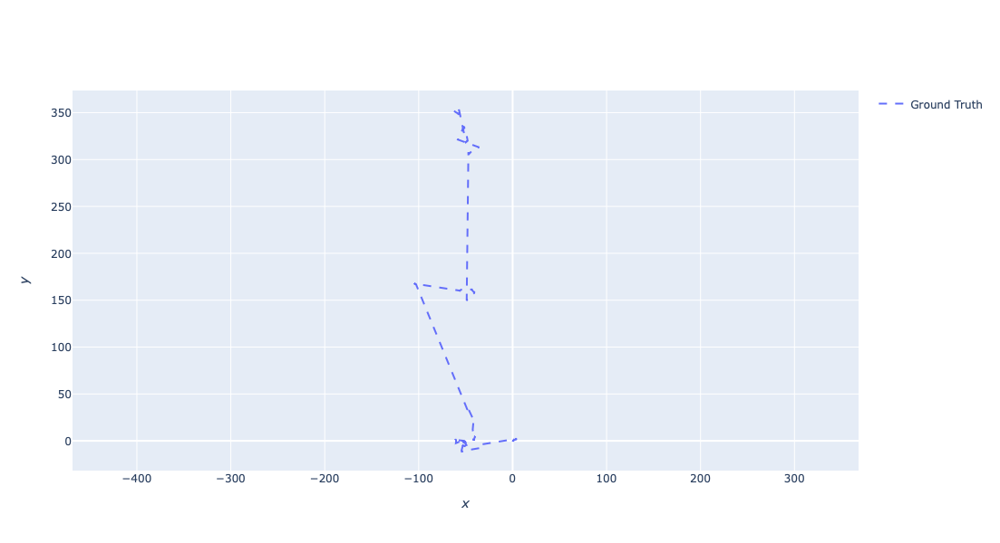

In [18]:
from stonesoup.plotter import Plotterly

plotter_static = Plotterly(autosize=False,
    width=600,
    height=600,)
plotter_static.plot_ground_truths(truth, [0, 1])
plotter_static.fig

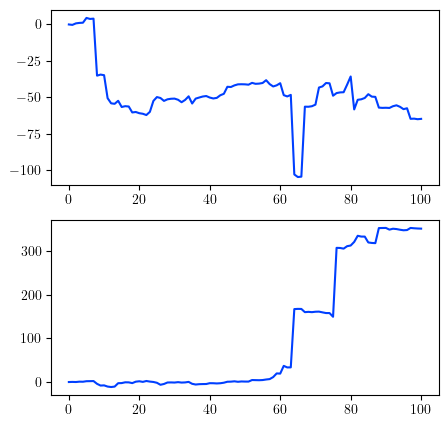

In [19]:
t = np.array([(data.timestamp - start_time).total_seconds() for data in truth])
t -= t[0]
y0 = np.array([data.state_vector[0] for data in truth])
y1 = np.array([data.state_vector[1] for data in truth])

fig, [ax1, ax2] = plt.subplots(nrows=2, ncols=1)

ax1.plot(t, y0)
ax2.plot(t, y1)


# Gaussian Langevin Example

In [96]:
from stonesoup.types.groundtruth import GroundTruthPath, GroundTruthState
from mystonesoup.drivers import GaussianDriver
from mystonesoup.base import CombinedLinearNonGaussianTransitionExtModel
from mystonesoup.models import Langevin
from datetime import datetime, timedelta

# And the clock starts
start_time = datetime.now().replace(microsecond=0)
seed = 1991

mu_W = 0.
sigma_W = 1.
theta = -0.1

gaussian_driver_x = GaussianDriver(mu_W=mu_W, sigma_W=sigma_W, seed=seed)
langevin_x = Langevin(theta=theta, g_driver=gaussian_driver_x)
gaussian_driver_x.register_model(langevin_x)

gaussian_driver_y = GaussianDriver(mu_W=mu_W, sigma_W=sigma_W, seed=seed+1)
langevin_y = Langevin(theta=theta, g_driver=gaussian_driver_y)
gaussian_driver_y.register_model(langevin_y)
transition_model = CombinedLinearNonGaussianTransitionExtModel([langevin_x, langevin_y])

timesteps = [start_time]
truth = GroundTruthPath([GroundTruthState([0, 1, 0, 1], timestamp=timesteps[0])])

num_steps = 100
for k in range(1, num_steps + 1):
    
    timesteps.append(start_time+timedelta(seconds=k))  # add next timestep to list of timesteps
    truth.append(GroundTruthState(
        transition_model.function(truth[k-1], noise=True, time_interval=timedelta(seconds=1)),
        timestamp=timesteps[k]))

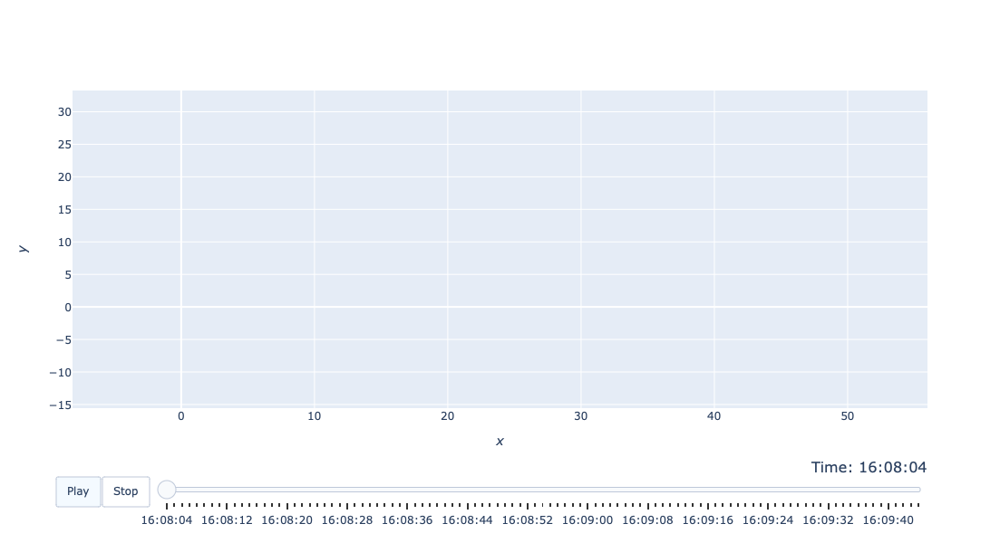

In [97]:
from stonesoup.plotter import AnimatedPlotterly
plotter = AnimatedPlotterly(timesteps, tail_length=0.3, width=600, height=600,)
plotter.plot_ground_truths(truth, [0, 2])
plotter.fig

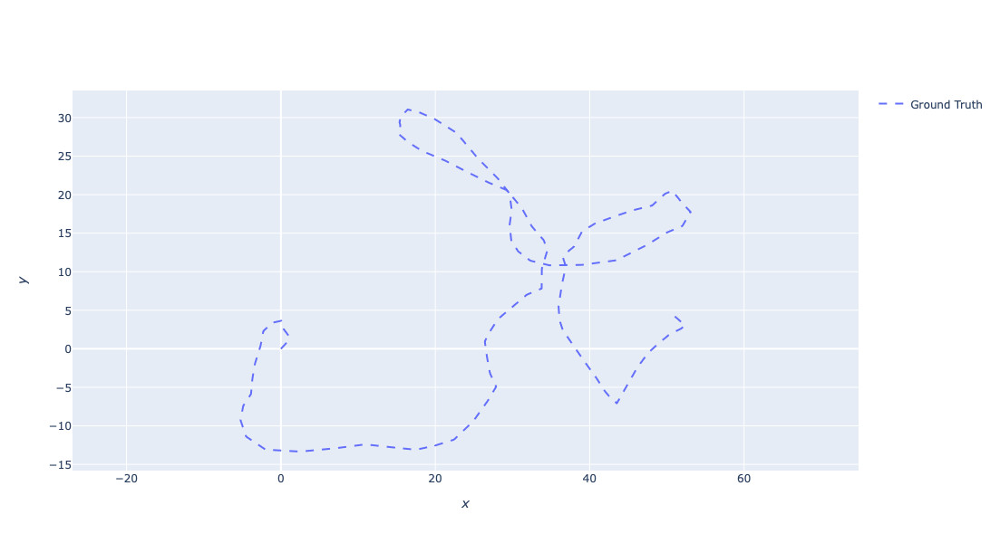

In [98]:
from stonesoup.plotter import Plotterly

plotter_static = Plotterly(autosize=False,
    width=600,
    height=600,)
plotter_static.plot_ground_truths(truth, [0, 2])
plotter_static.fig

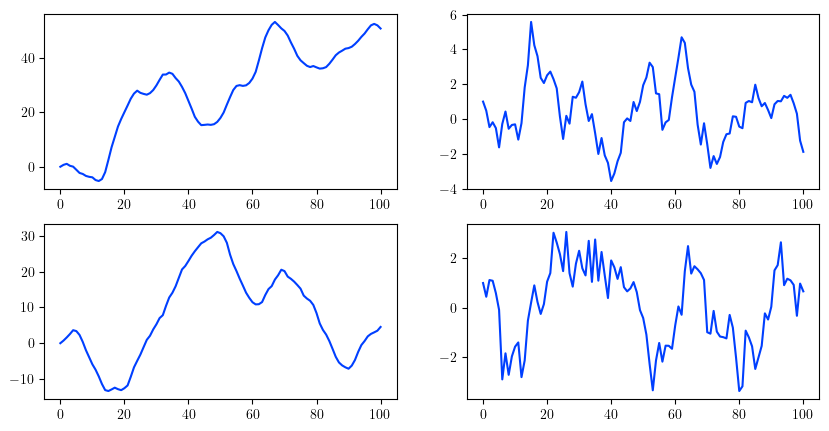

In [99]:
t = np.array([(data.timestamp - start_time).total_seconds() for data in truth])
t -= t[0]

y0 = np.array([data.state_vector[0] for data in truth])
y1 = np.array([data.state_vector[1] for data in truth])
y2 = np.array([data.state_vector[2] for data in truth])
y3 = np.array([data.state_vector[3] for data in truth])

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

axs[0][0].plot(t, y0)
axs[0][1].plot(t, y1)
axs[1][0].plot(t, y2)
axs[1][1].plot(t, y3)


## Test compatible with StoneSoup's measurement model

In [100]:
from stonesoup.types.detection import Detection
from stonesoup.models.measurement.linear import LinearGaussian

measurement_model = LinearGaussian(
    ndim_state=4,  # Number of state dimensions (position and velocity in 2D)
    mapping=(0, 2),  # Mapping measurement vector index to state index
    noise_covar=np.array([[5, 0],  # Covariance matrix for Gaussian PDF
                          [0, 5]])
    )

In [101]:
measurements = []
for state in truth:
    measurement = measurement_model.function(state, noise=True)
    measurements.append(Detection(measurement,
                                  timestamp=state.timestamp,
                                  measurement_model=measurement_model))

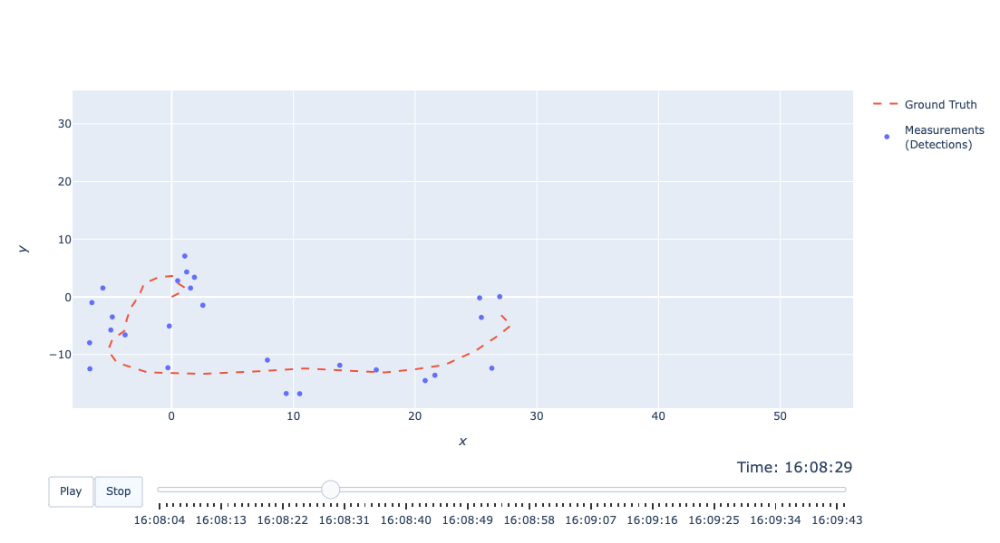

In [102]:
plotter.plot_measurements(measurements, [0, 2])
plotter.fig

## Test compatible with StoneSoup's Kalman filter

In [104]:
from stonesoup.predictor.kalman import KalmanPredictor
from stonesoup.updater.kalman import KalmanUpdater
from stonesoup.types.state import GaussianState
from stonesoup.types.hypothesis import SingleHypothesis
from stonesoup.types.track import Track

predictor = KalmanPredictor(transition_model)
updater = KalmanUpdater(measurement_model)

prior = GaussianState([[0], [1], [0], [1]], np.diag([1.5, 0.5, 1.5, 0.5]), timestamp=start_time)

track = Track()
for measurement in measurements:
    prediction = predictor.predict(prior, timestamp=measurement.timestamp)
    hypothesis = SingleHypothesis(prediction, measurement)  # Group a prediction and measurement
    post = updater.update(hypothesis)
    track.append(post)
    prior = track[-1]

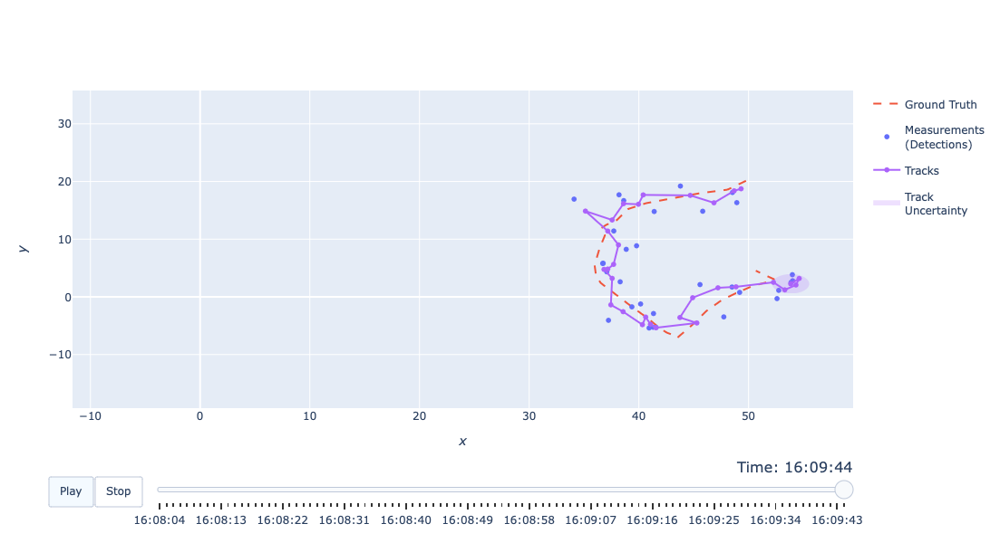

In [105]:
plotter.plot_tracks(track, [0, 2], uncertainty=True)
plotter.fig

# Alpha-Stable Langevin Example

## Simulation

In [42]:
from stonesoup.types.groundtruth import GroundTruthPath, GroundTruthState
from mystonesoup.drivers import AlphaStableDriver
from mystonesoup.base import CombinedLinearNonGaussianTransitionExtModel
from mystonesoup.models import Langevin
from datetime import datetime, timedelta

# And the clock starts
start_time = datetime.now().replace(microsecond=0)
seed = 4

mu_W = 0.
sigma_W = 1.
c = 10
alpha = 0.8
noise_case = 2
theta = -0.1

as_driver_x = AlphaStableDriver(c=c, alpha=alpha, mu_W=mu_W, sigma_W=sigma_W, noise_case=noise_case, seed=seed)
langevin_x = Langevin(theta=theta, ng_driver=as_driver_x)
as_driver_x.register_model(langevin_x)

langevin_y = Langevin(theta=theta, ng_driver=as_driver_x)
as_driver_x.register_model(langevin_y)
transition_model = CombinedLinearNonGaussianTransitionExtModel([langevin_x, langevin_y])

timesteps = [start_time]
truth = GroundTruthPath([GroundTruthState([0, 1, 0, 1], timestamp=timesteps[0])])

num_steps = 200
for k in range(1, num_steps + 1):
    timesteps.append(start_time+timedelta(seconds=k))  # add next timestep to list of timesteps
    truth.append(GroundTruthState(
        transition_model.function(truth[k-1], noise=True, time_interval=timedelta(seconds=1)),
        timestamp=timesteps[k]))


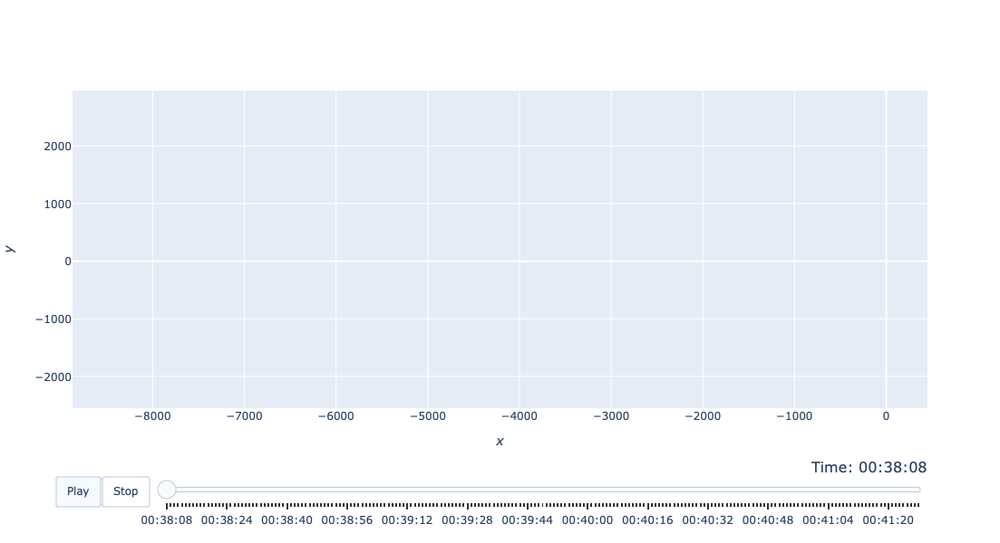

In [43]:
from stonesoup.plotter import AnimatedPlotterly
plotter = AnimatedPlotterly(timesteps, tail_length=0.3, width=600, height=600,)
plotter.plot_ground_truths(truth, [0, 2])
plotter.fig

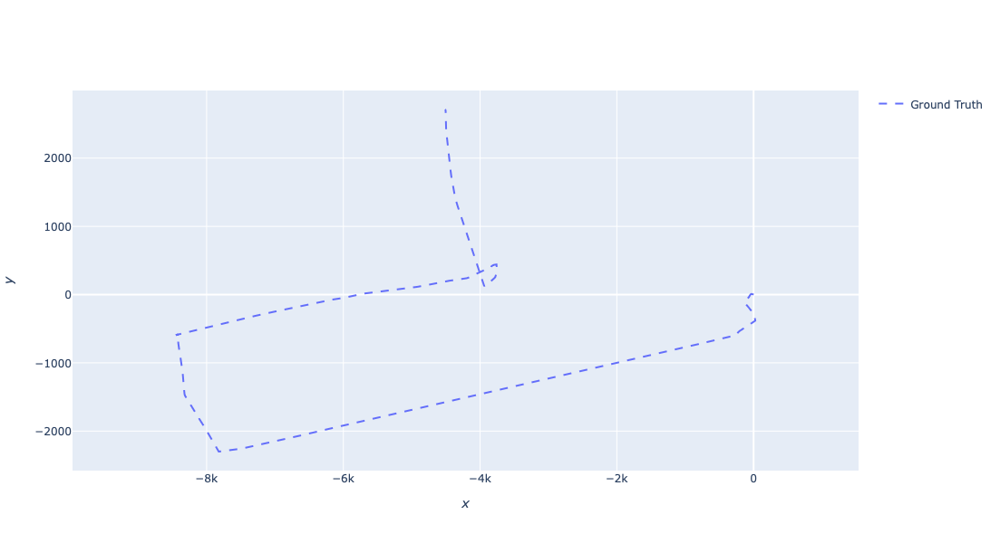

In [44]:
from stonesoup.plotter import Plotterly

plotter_static = Plotterly(autosize=False,
    width=600,
    height=600,)
plotter_static.plot_ground_truths(truth, [0, 2])
plotter_static.fig

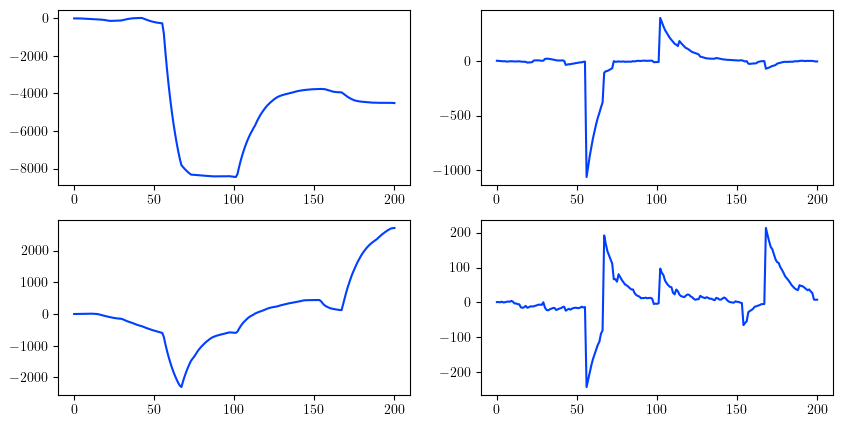

In [45]:
t = np.array([(data.timestamp - start_time).total_seconds() for data in truth])
t -= t[0]

y0 = np.array([data.state_vector[0] for data in truth])
y1 = np.array([data.state_vector[1] for data in truth])
y2 = np.array([data.state_vector[2] for data in truth])
y3 = np.array([data.state_vector[3] for data in truth])

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))

axs[0][0].plot(t, y0)
axs[0][1].plot(t, y1)
axs[1][0].plot(t, y2)
axs[1][1].plot(t, y3)


## Test compatible with StoneSoup's measurement model

In [46]:
from stonesoup.types.detection import Detection
from stonesoup.models.measurement.linear import LinearGaussian

measurement_model = LinearGaussian(
    ndim_state=4,  # Number of state dimensions (position and velocity in 2D)
    mapping=(0, 2),  # Mapping measurement vector index to state index
    noise_covar=np.array([[100000, 0],  # Covariance matrix for Gaussian PDF
                          [0, 100000]])
    )

measurements = []
for state in truth:
    measurement = measurement_model.function(state, noise=True)
    measurements.append(Detection(measurement,
                                  timestamp=state.timestamp,
                                  measurement_model=measurement_model))

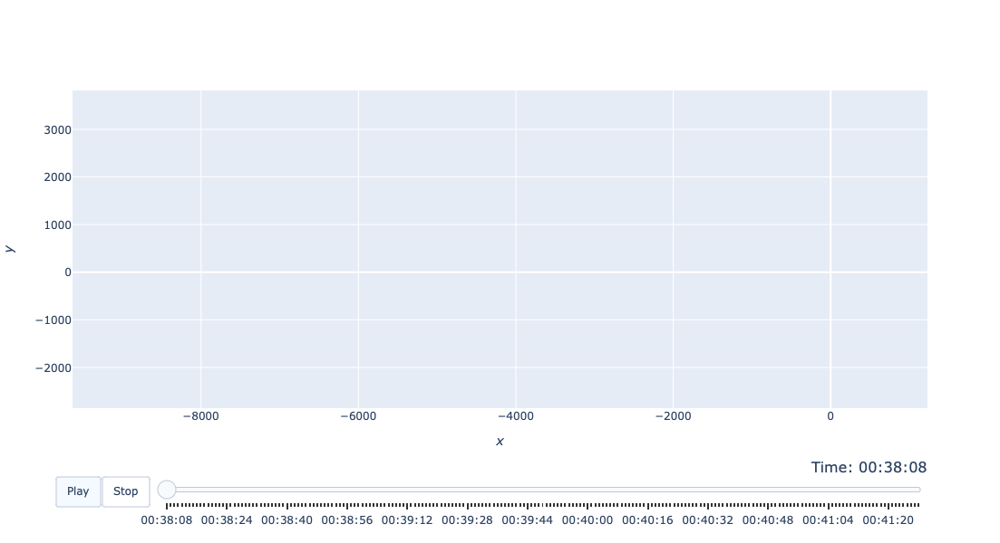

In [47]:
plotter.plot_measurements(measurements, [0, 2])
plotter.fig

## StoneSoup Particle Filter Example

In [48]:
# from stonesoup.predictor.particle import ParticlePredictor
# predictor = ParticlePredictor(transition_model)
# from stonesoup.resampler.particle import ESSResampler
# resampler = ESSResampler()
# from stonesoup.updater.particle import ParticleUpdater
# updater = ParticleUpdater(measurement_model, resampler)

In [49]:
# from scipy.stats import multivariate_normal

# from stonesoup.types.numeric import Probability  # Similar to a float type
# from stonesoup.types.state import ParticleState
# from stonesoup.types.array import StateVectors

# number_particles = 1000

# # Sample from the prior Gaussian distribution
# samples = multivariate_normal.rvs(np.array([0, 1, 0, 1]),
#                                   np.diag([1.5, 0.5, 1.5, 0.5]),
#                                   size=number_particles)

# # Create prior particle state.
# prior = ParticleState(state_vector=StateVectors(samples.T),
#                       weight=np.array([Probability(1/number_particles)]*number_particles),
#                       timestamp=start_time)

In [50]:
# from stonesoup.types.hypothesis import SingleHypothesis
# from stonesoup.types.track import Track

# track = Track()
# for measurement in measurements:
#     prediction = predictor.predict(prior, timestamp=measurement.timestamp)
#     hypothesis = SingleHypothesis(prediction, measurement)
#     post = updater.update(hypothesis)
#     track.append(post)
#     prior = track[-1]

In [51]:
# plotter.plot_tracks(track, [0, 2], particle=True, plot_history=False)
# plotter.fig

## Particle Filter

In [121]:
from mystonesoup.filters import RBParticlePredictor
predictor = RBParticlePredictor(transition_model=transition_model)

from stonesoup.resampler.particle import ESSResampler
resampler = ESSResampler()

from mystonesoup.filters import RBParticleUpdater
updater = RBParticleUpdater(measurement_model, resampler)

In [122]:
from scipy.stats import multivariate_normal

from stonesoup.types.numeric import Probability  # Similar to a float type
from mystonesoup.filters import RBParticleState
from stonesoup.types.array import StateVectors

number_particles = 100

# Sample from the prior Gaussian distribution
states = multivariate_normal.rvs(np.array([0, 1, 0, 1]),
                                  np.diag([1., 1., 1., 1.]),
                                  size=number_particles)
covars = np.stack([np.eye(4) for i in range(number_particles)], axis=2)

# Create prior particle state.
prior = RBParticleState(
    state_vector=StateVectors(states.T),
    covariance=covars,
    weight=np.array([Probability(1/number_particles)]*number_particles),
                      timestamp=start_time)

In [123]:
from stonesoup.types.hypothesis import SingleHypothesis
from stonesoup.types.track import Track

track = Track()
for measurement in measurements:
    prediction = predictor.predict(prior, timestamp=measurement.timestamp)
    hypothesis = SingleHypothesis(prediction, measurement)
    post = updater.update(hypothesis)
    track.append(post)
    prior = track[-1]


ValueError: arguments in the following positions have dimension greater than 2: [0, 1]

In [ ]:
plotter.plot_tracks(track, [0, 2], particle=True, plot_history=False)
plotter.fig

In [ ]:
# Need to include covar and mean functions in alpha stable driver
# Might consider modifying the kalman filter in stonesoup to handle mean -> just extend it
# Leave functions like PDF unimplemented for now
# Update documentations
# Need to change update typehints to those used by SS
# Need to meet SS developers
# When are having the workshop, should i drop an email?

In [ ]:
# Integration test / examples
# Gaussian Process
# AS process
# Gaussian Langevin
# AS Langevin